<a href="https://colab.research.google.com/github/ncb166/AI_/blob/main/AI1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving animal_data.zip to animal_data.zip


In [ ]:
import zipfile
import os

with zipfile.ZipFile("animal_data.zip", 'r') as zip_ref:
    zip_ref.extractall("animal_data")

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# For data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Ingore the warnings
import warnings
warnings.filterwarnings('ignore')

# DL Libraries
import os
import random
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.utils import image_dataset_from_directory, to_categorical
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
import json  # Import thư viện json
from keras.models import load_model

from keras.optimizers import Adam
print("GPU available:", tf.config.list_physical_devices('GPU'))



GPU available: []


In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications import DenseNet121
# from tensorflow.keras.applications import NASNetLarge


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [ ]:
import shutil
import os

src = "animal_data/animal_data"
dst = "animal_data"

# Di chuyển tất cả thư mục con từ animal_data/animal_data -> animal_data
for folder in os.listdir(src):
    shutil.move(os.path.join(src, folder), dst)

# Xóa thư mục trống animal_data/animal_data
os.rmdir(src)

print("Đã di chuyển nội dung đúng cấp thư mục.")

Đã di chuyển nội dung đúng cấp thư mục.


In [ ]:
#set up contanst
COLOR_MODE = 'rgb'
IMG_WIDTH = 224
IMG_HEIGHT = 224
IMG_CHANNELS = 3
BATCH_SIZE = 128
BUFFER_SIZE = BATCH_SIZE*5

# Load the image dataset from the directory using utils
dataset = keras.utils.image_dataset_from_directory(
    directory = 'animal_data',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(224, 224),
    color_mode='rgb',
    shuffle=True,
    seed=123
)

Found 1944 files belonging to 15 classes.


In [ ]:
# Tính toán kích thước của các tập train, validation và test
dataset_size = len(dataset)
train_size = int(0.7 * dataset_size)
val_size = int(0.2 * dataset_size)
test_size = dataset_size - train_size - val_size

# Chia dữ liệu thành train, validation và test
train_ds = dataset.take(train_size)
remaining_ds = dataset.skip(train_size)
val_ds = remaining_ds.take(val_size)
test_ds = remaining_ds.skip(val_size).take(test_size)

# Sử dụng caching và prefetching để tối ưu hóa hiệu suất
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Kiểm tra kích thước của các tập dữ liệu
print(f'Train dataset size: {train_size * 32} images')
print(f'Validation dataset size: {val_size * 32} images')
print(f'Test dataset size: {test_size * 32} images')

Train dataset size: 1344 images
Validation dataset size: 384 images
Test dataset size: 224 images


In [ ]:
# Extrating the class labels
# Trích xuất nhãn lớp
classes = dataset.class_names
print(f'{classes}')

# Đảm bảo nhãn được mã hóa one-hot
def preprocess_dataset(dataset, num_classes):
    def one_hot_encode(image, label):
        label = tf.one_hot(label, num_classes)
        return image, label
    return dataset.map(one_hot_encode)

# 'classes' là danh sách chứa các lớp
num_classes = len(classes)

train_ds = preprocess_dataset(train_ds, num_classes).cache().prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = preprocess_dataset(val_ds, num_classes).cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = preprocess_dataset(test_ds, num_classes).cache().prefetch(buffer_size=tf.data.AUTOTUNE)

['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']


In [ ]:
normalization_layer_64 = tf.keras.layers.Rescaling(1./64)
train_ds_64 = train_ds.map(lambda x, y: (normalization_layer_64(x), y))
val_ds_64 = val_ds.map(lambda x, y: (normalization_layer_64(x), y))
test_ds_64 = test_ds.map(lambda x, y: (normalization_layer_64(x), y))

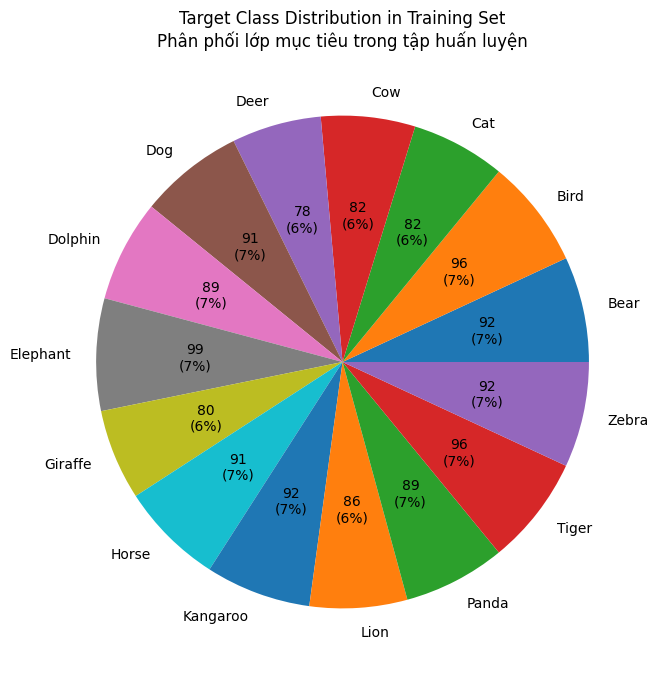

In [ ]:
# Get number of classes
num_classes = len(classes)

# Count the number of images for each class in the training set
label_counts = np.zeros(num_classes, dtype=int)

for images, labels in train_ds:
    for label in labels.numpy():
        label_counts[np.argmax(label)] += 1  # Using np.argmax to get the class index

# Create the pie chart
def autopct_generator(counts):
    def inner_autopct(pct):
        total = sum(counts)
        absolute = int(pct / 100. * total)
        return f"{absolute}\n({pct:.0f}%)"
    return inner_autopct

plt.figure(figsize=(10, 8))
plt.pie(label_counts, labels=classes, autopct=autopct_generator(label_counts))
plt.title('Target Class Distribution in Training Set\nPhân phối lớp mục tiêu trong tập huấn luyện')

plt.show()

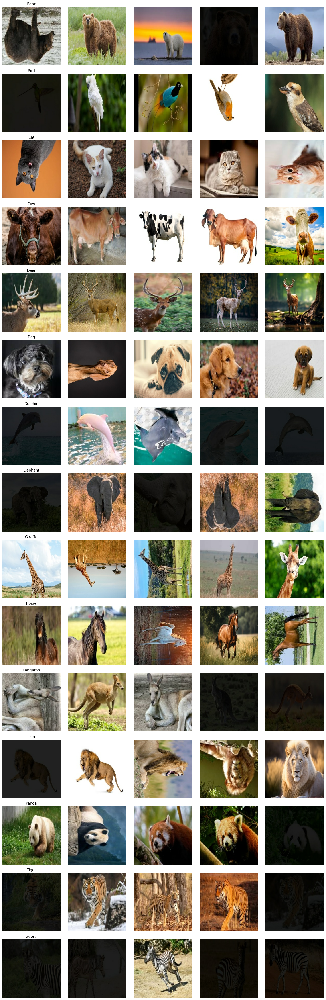

In [ ]:
# Số lượng lớp học
num_classes = len(dataset.class_names)

# Khởi tạo danh sách để lưu trữ hình ảnh cho mỗi lớp
images_per_class = {class_name: [] for class_name in dataset.class_names}

# Duyệt qua tập dữ liệu kiểm tra và lưu 5 hình ảnh cho mỗi lớp
for images, labels in test_ds:
    for img, lbl in zip(images.numpy(), labels.numpy()):
        class_idx = np.argmax(lbl)
        class_name = dataset.class_names[class_idx]
        if len(images_per_class[class_name]) < 5:
            images_per_class[class_name].append(img)
        # Nếu đã thu thập đủ 5 hình ảnh cho tất cả các lớp, thoát khỏi vòng lặp
        if all(len(images_per_class[class_name]) >= 5 for class_name in dataset.class_names):
            break
    # Kiểm tra lại điều kiện thoát
    if all(len(images_per_class[class_name]) >= 5 for class_name in dataset.class_names):
        break

# Vẽ hình ảnh
fig, axes = plt.subplots(num_classes, 5, figsize=(15, num_classes * 3))
for class_idx, (class_name, images) in enumerate(images_per_class.items()):
    for img_idx, img in enumerate(images):
        ax = axes[class_idx, img_idx]
        ax.imshow(img.astype("uint8"))
        ax.axis('off')
        if img_idx == 0:
            ax.set_title(class_name)

plt.tight_layout()
plt.show()

In [ ]:
vgg16 = VGG16(include_top=False,
                   weights='imagenet',
                   input_shape=(IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))

for layer in vgg16.layers:
  layer.trainable = False

flat = Flatten()(vgg16.layers[-1].output)
fc1 = Dense(1024, activation='relu')(flat)
output = Dense(len(classes), activation='softmax')(fc1)

model1 = Model(inputs=vgg16.inputs, outputs=output)
# model1.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Biên dịch mô hình
model1.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# Huấn luyện mô hình
history1 = model1.fit(train_ds, batch_size=32, epochs=10,
          validation_data=(val_ds))

Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1143s 27s/step - accuracy: 0.6791 - loss: 24.5098 - val_accuracy: 0.9062 - val_loss: 4.4870
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1202s 28s/step - accuracy: 0.9443 - loss: 2.4705 - val_accuracy: 0.9297 - val_loss: 3.4352
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1180s 28s/step - accuracy: 0.9788 - loss: 0.6924 - val_accuracy: 0.8906 - val_loss: 5.2015
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1184s 28s/step - accuracy: 0.9774 - loss: 0.4929 - val_accuracy: 0.9219 - val_loss: 4.1801
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1210s 28s/step - accuracy: 0.9827 - loss: 0.2750 - val_accuracy: 0.9271 - val_loss: 4.4940
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1222s 28s/step - accuracy: 0.9913 - loss: 0.1558 - val_accuracy: 0.9375 - val_loss: 4.3791
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1213s 29s/step - accuracy: 0.9886 - loss: 0.4133 - val_accuracy: 0.9349 - val_loss: 5.1428
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 1184s 28s/step - accuracy: 0.9931 - loss: 0.1908 - val_acc

In [ ]:
mobilenetv3small = MobileNetV3Small(input_shape=(IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS),
                                    include_top=False,
                                    weights='imagenet',
                                    classes=15)

for layer in mobilenetv3small.layers:
  layer.trainable = False

flat = Flatten()(mobilenetv3small.layers[-1].output)
fc1 = Dense(1024, activation='relu')(flat)
output = Dense(len(classes), activation='softmax')(fc1)

model3 = Model(inputs=mobilenetv3small.inputs, outputs=output)
model3.summary()

4334752/4334752 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv (Conv2D)       │ (None, 112, 112,  │        432 │ rescaling_1[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_bn             │ (None, 112, 112,  │         64 │ conv[0][0]        │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 112, 112,  │          0 │ conv_bn[0][0]     │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 113, 113,  │          0 │ activation[0][0]  │
│ (ZeroPadding2D)     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 56, 56,    │        144 │ expanded_conv_de… │
│ (DepthwiseConv2D)   │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 56, 56,    │         64 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 56, 56,    │          0 │ expanded_conv_de… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 16)  │          0 │ re_lu[0][0]       │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 8)   │        136 │ expanded_conv_sq… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 8)   │          0 │ expanded_conv_sq… │
│ (ReLU)              │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 16)  │        144 │ expanded_conv_sq… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 1, 1, 16)  │          0 │ expanded_conv_sq… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 1, 1, 16)  │          0 │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 1, 1, 16)  │          0 │ re_lu_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 56, 56,    │          0 │ re_lu[0][0],      │
│ (Multiply)          │ 16)               │            │ multiply[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 56, 56,    │        256 │ expanded_conv_sq

 Total params: 29,856,895 (113.90 MB)

 Trainable params: 28,917,775 (110.31 MB)

 Non-trainable params: 939,120 (3.58 MB)

In [ ]:
# Biên dịch mô hình
model3.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# Huấn luyện mô hình
history3 = model3.fit(train_ds, batch_size=32, epochs=10,
          validation_data=val_ds)

Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.5582 - loss: 7.7955 - val_accuracy: 0.9036 - val_loss: 0.5680
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.9716 - loss: 0.1630 - val_accuracy: 0.9297 - val_loss: 0.4596
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.9956 - loss: 0.0227 - val_accuracy: 0.9271 - val_loss: 0.3640
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.9977 - loss: 0.0079 - val_accuracy: 0.9375 - val_loss: 0.4420
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 86s 1s/step - accuracy: 0.9966 - loss: 0.0127 - val_accuracy: 0.9245 - val_loss: 0.6751
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.9940 - loss: 0.0557 - val_accuracy: 0.9115 - val_loss: 0.8921
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 52s 1s/step - accuracy: 0.9876 - loss: 0.1008 - val_accuracy: 0.9193 - val_loss: 0.6221
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.9910 - loss: 0.0771 - val_accuracy: 0.9062 - val_loss:

In [ ]:
from tensorflow.keras.layers import BatchNormalization

dense_net = DenseNet121(input_shape=(IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS),
                        include_top=False,
                        weights='imagenet')

# Cho phép một số lớp cuối cùng có thể huấn luyện
for layer in dense_net.layers[:-10]:
    layer.trainable = False
for layer in dense_net.layers[-10:]:
    layer.trainable = True

flat = Flatten()(dense_net.layers[-1].output)
fc1 = Dense(1024, activation='relu')(flat)
fc1 = BatchNormalization()(fc1)  # Thêm Batch Normalization
fc1 = Dropout(0.5)(fc1)  # Thêm lớp Dropout
output = Dense(len(classes), activation='softmax')(fc1)

model4 = Model(inputs=dense_net.inputs, outputs=output)
# model4.summary()

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Biên dịch mô hình
model4.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Huấn luyện mô hình
history4 = model4.fit(train_ds_64, batch_size=32, epochs=10,
          validation_data=(val_ds_64))

Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 422s 10s/step - accuracy: 0.7314 - loss: 1.1589 - val_accuracy: 0.9036 - val_loss: 0.5106
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 430s 9s/step - accuracy: 0.9966 - loss: 0.0167 - val_accuracy: 0.9661 - val_loss: 0.1381
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 442s 9s/step - accuracy: 1.0000 - loss: 0.0044 - val_accuracy: 0.9688 - val_loss: 0.1093
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 438s 9s/step - accuracy: 1.0000 - loss: 0.0020 - val_accuracy: 0.9688 - val_loss: 0.1036
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 388s 9s/step - accuracy: 1.0000 - loss: 0.0020 - val_accuracy: 0.9714 - val_loss: 0.0977
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 443s 9s/step - accuracy: 0.9993 - loss: 0.0020 - val_accuracy: 0.9688 - val_loss: 0.0952
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 447s 9s/step - accuracy: 1.0000 - loss: 9.3560e-04 - val_accuracy: 0.9714 - val_loss: 0.0947
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 445s 9s/step - accuracy: 1.0000 - loss: 7.9708e-04 - val_accuracy: 0

2/2 ━━━━━━━━━━━━━━━━━━━━ 21s 8s/step


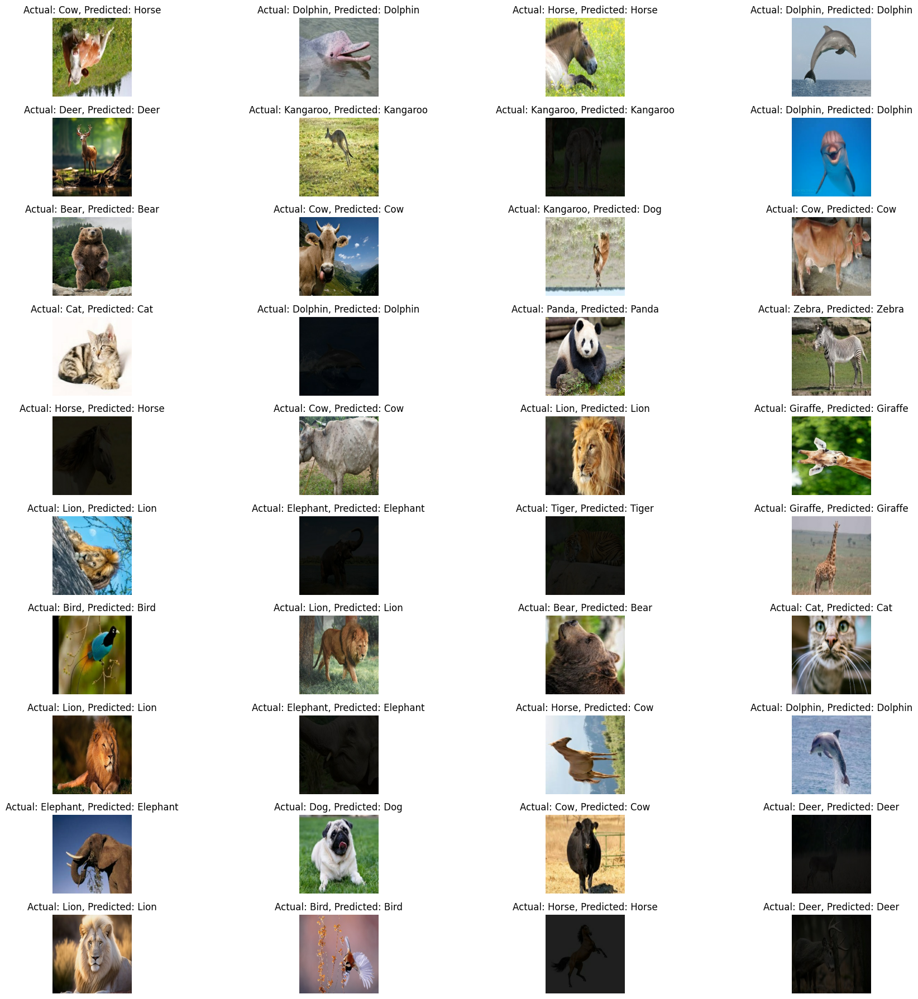

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Số lượng hình ảnh cần hiển thị
num_images_to_display = 40
images = []
y_true = []

# Lấy 40 hình ảnh và nhãn từ test_ds
for img, lbl in test_ds_64.unbatch().take(num_images_to_display):
    images.append(img.numpy())  # Lưu hình ảnh đã chuẩn hóa
    y_true.append(np.argmax(lbl.numpy()))

# Chuyển đổi danh sách thành mảng numpy
images = np.array(images)
y_true = np.array(y_true)

# Chuyển đổi dữ liệu ảnh thành Tensor để dự đoán
images_tensor = tf.convert_to_tensor(images)

# Dự đoán trên các ảnh đã chuyển đổi
pred = model4.predict(images_tensor)
y_pred = np.argmax(pred, axis=1)

# Số lượng hình ảnh và nhãn thực tế trong test_ds
num_actual_images = len(images)

# Hiển thị hình ảnh và nhãn dự đoán
num_columns = 4
num_rows = (num_actual_images + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, 18))
for i, ax in enumerate(axes.flat):
    if i < num_actual_images:
        # Khôi phục giá trị pixel về dải 0-255 để hiển thị
        image_to_display = (images[i] * 64).astype("uint8")
        ax.imshow(image_to_display)
        actual_label = dataset.class_names[y_true[i]]
        predicted_label = dataset.class_names[y_pred[i]]
        ax.set_title(f"Actual: {actual_label}, Predicted: {predicted_label}")
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

Saving tải xuống (7).jpg to tải xuống (7) (2).jpg


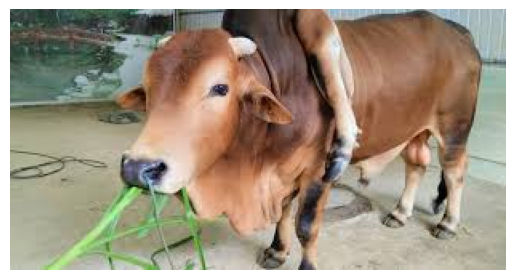

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step
VGG16 Predicted class: Cow
MobileNetV3 Predicted class: Cow
Dense Predicted class: Cow


In [ ]:
from google.colab import files
uploaded = files.upload()
# print(uploaded)

from PIL import Image
filename = next(iter(uploaded))

image = Image.open(filename)
plt.imshow(image)
plt.axis('off')  # Hide axes
plt.show()

# Load the image
image = tf.keras.preprocessing.image.load_img(filename, target_size=(224, 224, 3))

# image = tf.keras.preprocessing.image.load_img(filename)
# Preprocess the image
image = tf.keras.preprocessing.image.img_to_array(image)
image_64 = image/64.0

# Add a batch dimension
image = np.expand_dims(image, axis=0)
image_64 = np.expand_dims(image_64, axis=0)

# Predict the class
predictions1 = model1.predict(image)
predictions3 = model3.predict(image)
predictions4 = model4.predict(image_64)

# Get the class with the highest probability
predicted_class1 = np.argmax(predictions1)
predicted_class3 = np.argmax(predictions3)
predicted_class4 = np.argmax(predictions4)

# Print the predicted class
print(f"VGG16 Predicted class: {classes[predicted_class1]}")
print(f"MobileNetV3 Predicted class: {classes[predicted_class3]}")
print(f"Dense Predicted class: {classes[predicted_class4]}")

In [ ]:
y_true = []
for images, labels in test_ds:
    y_true.extend(np.argmax(labels, axis=1))
def evaluate_model(model, test_ds):
    # y_true = []
    y_pred = []

    for images, labels in test_ds:
        predictions = model.predict(images)
        y_pred.extend(np.argmax(predictions, axis=1))
        # y_true.extend(np.argmax(labels, axis=1))

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_true, y_pred)

    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    # print("Confusion Matrix:\n", conf_matrix)

    return accuracy, precision, recall, f1, conf_matrix

In [ ]:
 histories = [history1.history, history3.history, history4.history]

 # Thu thập dữ liệu từ lịch sử huấn luyện
 train_loss = [history['loss'] for history in histories]
histories = [history1.history, history3.history, history4.history]

 # Thu thập dữ liệu từ lịch sử huấn luyện
train_loss = [history['loss'] for history in histories]
val_loss = [history['val_loss'] for history in histories]
train_acc = [history['accuracy'] for history in histories]
val_acc = [history['val_accuracy'] for history in histories]

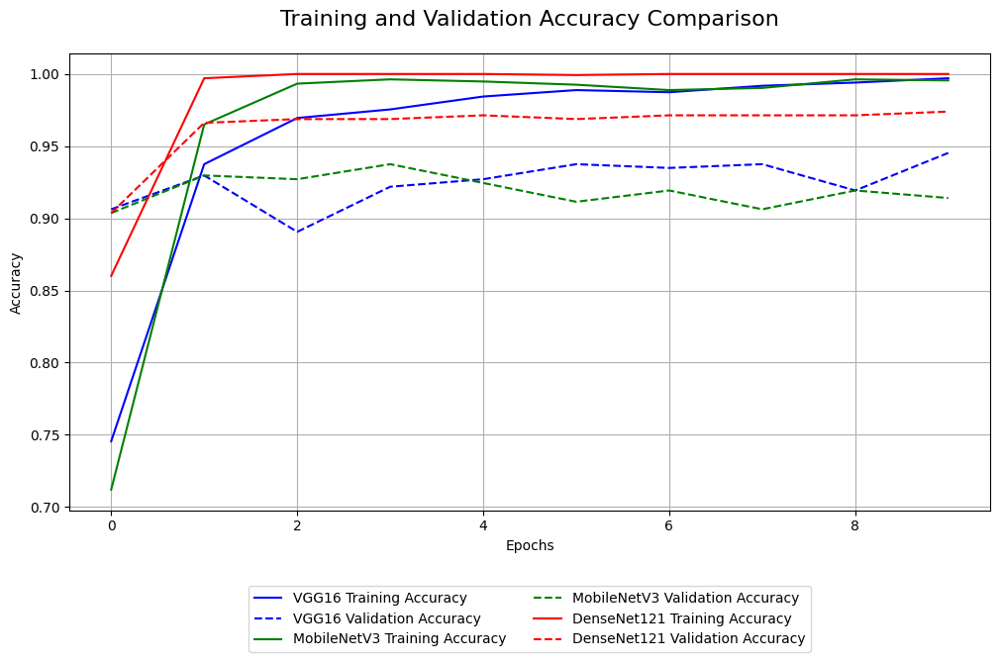

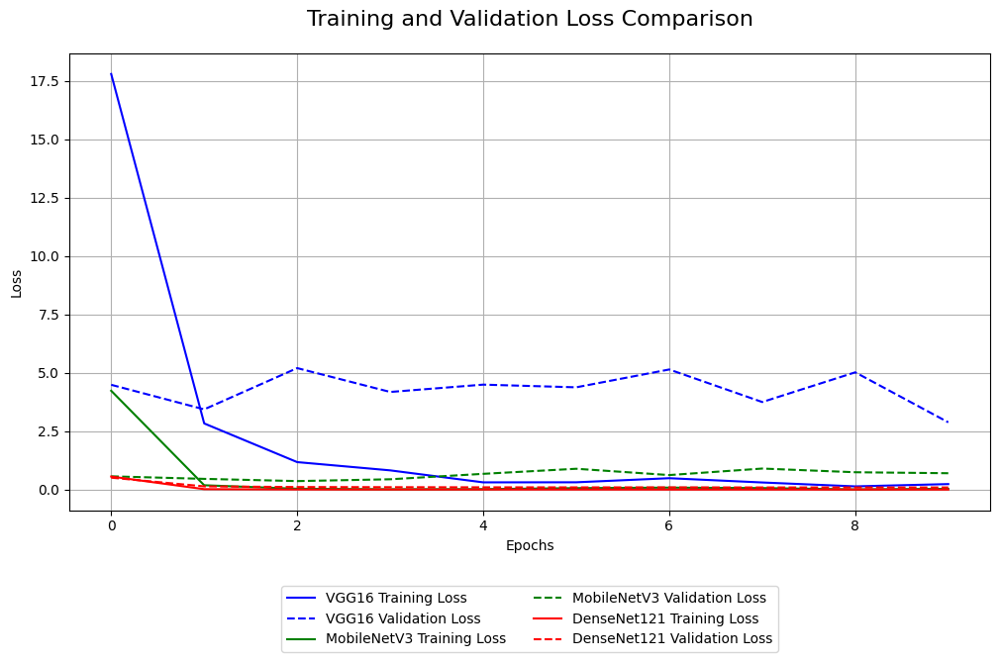

In [ ]:
import matplotlib.pyplot as plt
# json and numpy imports are already in the code, no need to repeat here

# model_names and histories lists are already defined in the previous cells

# Trích xuất thông tin từ lịch sử huấn luyện
train_loss = [history['loss'] for history in histories]
val_loss = [history['val_loss'] for history in histories]
train_acc = [history['accuracy'] for history in histories]
val_acc = [history['val_accuracy'] for history in histories]

# Màu sắc cho từng mô hình
colors = ['blue', 'green', 'red']

# Vẽ đồ thị Accuracy
plt.figure(figsize=(12, 6))
# Change the loop range to iterate over the number of histories (or models)
for i in range(len(histories)):
    plt.plot(train_acc[i], label=f'{model_names[i]} Training Accuracy', linestyle='-', color=colors[i])
    plt.plot(val_acc[i], label=f'{model_names[i]} Validation Accuracy', linestyle='--', color=colors[i])

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy Comparison', fontsize=16, pad=20)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.grid(True)
plt.show()

print('\n\n ')

# Vẽ đồ thị Loss
plt.figure(figsize=(12, 6))
# Change the loop range to iterate over the number of histories (or models)
for i in range(len(histories)):
    plt.plot(train_loss[i], label=f'{model_names[i]} Training Loss', linestyle='-', color=colors[i])
    plt.plot(val_loss[i], label=f'{model_names[i]} Validation Loss', linestyle='--', color=colors[i])

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Comparison', fontsize=16, pad=20)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.grid(True)
plt.show()

In [ ]:
# Các mô hình và tên để hiển thị
models = [model1, model3, model4]
model_names = ['VGG16', 'MobileNetV3', 'DenseNet121']
metrics = ['Precision', 'Recall', 'F1-score']
colors = ['green', 'blue', 'red']

# Test các mô hình đã huấn luyện trên tập Test_ds
results = {}
for i in range(len(model_names)):
    model = models[i]
    name = model_names[i]
    if name == "DenseNet121":
        accuracy, precision, recall, f1, conf_matrix = evaluate_model(model, test_ds_64)
    else:
        accuracy, precision, recall, f1, conf_matrix = evaluate_model(model, test_ds)
    results[name] = {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "conf_matrix": conf_matrix}

1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 24s 24s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
Accuracy: 0.9259259259259259
Precision: 0.9303688522169774
Recall: 0.9259259259259259
F1 Score: 0.9246726218040072
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step
Accuracy: 0.9074074074074074
Precision: 0.9177779289336521
Recall: 0.9074074074074074
F1 Score: 0.9078876427822704
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━

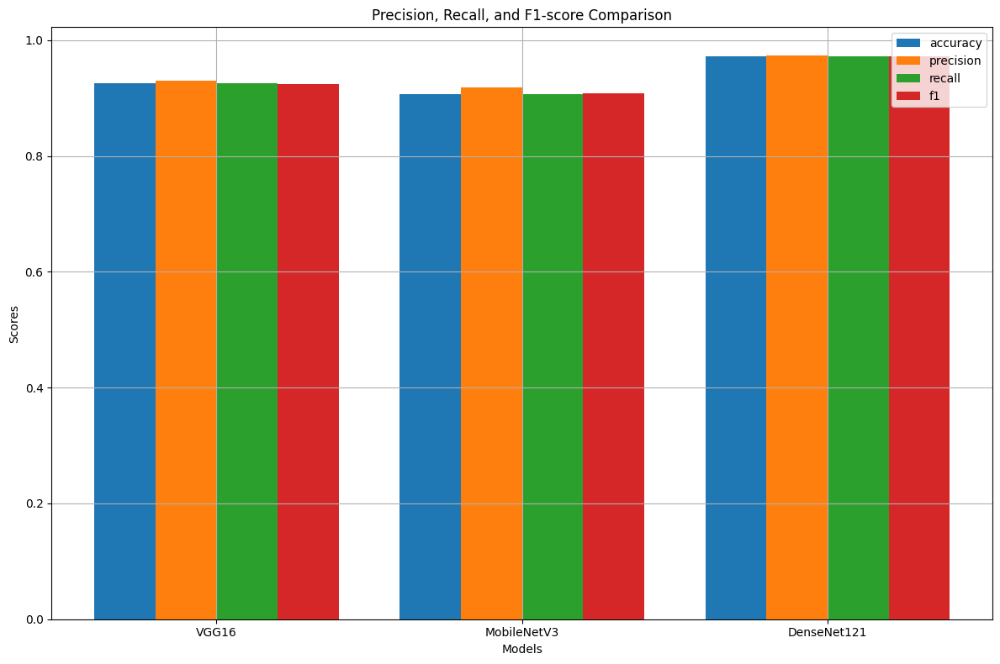

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

model_names = list(results.keys())
metrics = list(results[model_names[0]].keys())
metrics.remove('conf_matrix')
values = [[results[model_name][metric] for model_name in model_names] for metric in metrics]

x = np.arange(len(model_names))
width = 0.2

fig, ax = plt.subplots(figsize=(12, 8))

for i, metric in enumerate(metrics):
    offset = width * i
    rects = ax.bar(x + offset, values[i], width, label=metric, align='center')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Precision, Recall, and F1-score Comparison')
ax.set_xticks(x + width * 1.5)  # Đặt ticks ở giữa giữa các nhóm cột
ax.set_xticklabels(model_names, ha='center')  # Đặt nhãn trục x ở giữa
ax.legend()

plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
from tabulate import tabulate

# Chuyển đổi dữ liệu vào danh sách các dòng
table = []
for model_name, metrics in results.items():
    table.append([model_name, metrics['accuracy'], metrics['precision'], metrics['recall'], metrics['f1']])

# In bảng sử dụng tabulate
headers = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1-score']
print(tabulate(table, headers=headers, floatfmt=".4f"))

Model          Accuracy    Precision    Recall    F1-score
-----------  ----------  -----------  --------  ----------
VGG16            0.9259       0.9304    0.9259      0.9247
MobileNetV3      0.9074       0.9178    0.9074      0.9079
DenseNet121      0.9722       0.9737    0.9722      0.9723


In [ ]:
model3.save('mobilenetv3_model.keras')  # Định dạng mới nhất, nhẹ và ít lỗi

In [ ]:
from google.colab import files
files.download('mobilenetv3_model.keras')  # Hoặc .h5

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>